# Task 1: Low-Rank Video Modeling (PCA on Raw Frames)

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import os

os.makedirs('task1_outputs', exist_ok=True)

## Load Video and Build Frame Matrix

In [ ]:
VIDEO_PATH = 'football_video.mp4'
#VIDEO_PATH = 'soybean_timelapse.mp4'
RESIZE = True
SCALE = 0.75 # 1.0 for full res

cap = cv2.VideoCapture(VIDEO_PATH)
fps = cap.get(cv2.CAP_PROP_FPS)
frames = []

while True:
    ret, frame = cap.read()
    if not ret:
        break
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    if RESIZE:
        h, w = frame_rgb.shape[:2]
        frame_rgb = cv2.resize(frame_rgb, (int(w * SCALE), int(h * SCALE)))
    frames.append(frame_rgb)

cap.release()

frames = np.array(frames, dtype=np.float64)
T, H, W, C = frames.shape
print(f'Number of frames (T): {T}')
print(f'Frame dimensions: {H} x {W} x {C}')
print(f'Flattened vector length (H*W*C): {H * W * C}')

Number of frames (T): 913
Frame dimensions: 324 x 576 x 3
Flattened vector length (H*W*C): 559872


In [ ]:
# Flatten each frame into a row vector and stack into matrix X
X = frames.reshape(T, -1)
print(f'Data matrix X shape: {X.shape}')      # (T, H*W*C)
print(f'Memory usage: {X.nbytes / 1e9:.2f} GB')

Data matrix X shape: (913, 559872)
Memory usage: 4.09 GB


## Perform PCA

In [ ]:
from sklearn.decomposition import IncrementalPCA

pca = PCA(svd_solver='arpack')
pca.fit(X)


''' Attempt incremental PCA
#n_batches = 10
#pca = IncrementalPCA()
#for batch in np.array_split(X, n_batches):
#    pca.partial_fit(batch)
#X_pa = pca.transform(X)
'''

explained = pca.explained_variance_ratio_
cumulative = np.cumsum(explained)

print(f'Total principal components: {len(explained)}')

Total principal components: 912


## Cumulative Explained Variance Plot

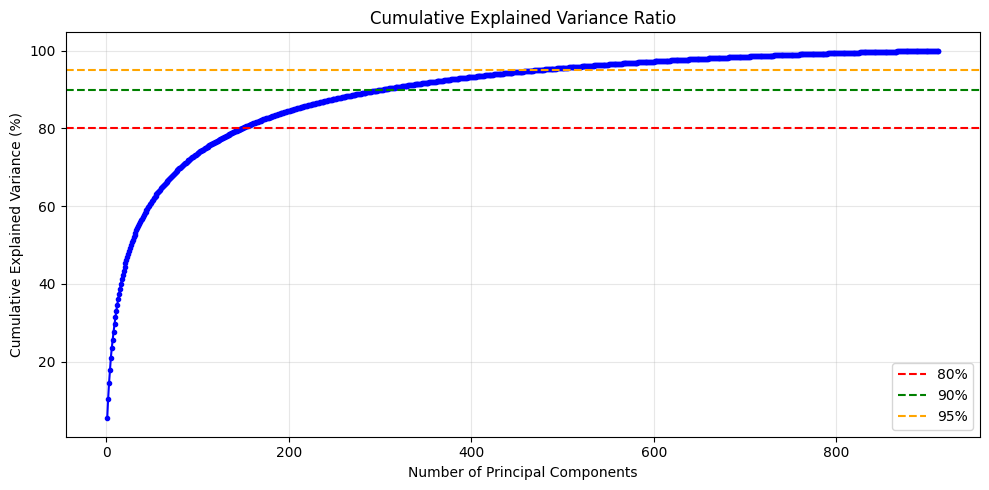

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.plot(range(1, len(cumulative) + 1), cumulative * 100, 'b-o', markersize=3)
ax.axhline(y=80, color='r', linestyle='--', label='80%')
ax.axhline(y=90, color='g', linestyle='--', label='90%')
ax.axhline(y=95, color='orange', linestyle='--', label='95%')
ax.set_xlabel('Number of Principal Components')
ax.set_ylabel('Cumulative Explained Variance (%)')
ax.set_title('Cumulative Explained Variance Ratio')
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('task1_outputs/cumulative_variance.png', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
# Number of components for 80%, 90%, 95% thresholds
for thresh in [0.80, 0.90, 0.95]:
    n = np.searchsorted(cumulative, thresh) + 1
    print(f'{int(thresh*100)}% variance explained by {n} components')

80% variance explained by 149 components
90% variance explained by 303 components
95% variance explained by 473 components


## Reconstruct Frames with k = 1, 5, 20 Components

In [ ]:
mean_frame = pca.mean_                    # shape: (H*W*C,)
components = pca.components_              # shape: (n_components, H*W*C)
X_centered = X - mean_frame               # centered data

def reconstruct(X_centered, components, mean, k):
    """Reconstruct using top-k principal components."""
    scores = X_centered @ components[:k].T       # project: (T, k)
    recon = scores @ components[:k] + mean        # back-project + add mean
    return np.clip(recon, 0, 255)                 # clip to valid pixel range

k_values = [1, 5, 20]
reconstructions = {}
for k in k_values:
    reconstructions[k] = reconstruct(X_centered, components, mean_frame, k)
    print(f'Reconstructed with k={k}')

Reconstructed with k=1
Reconstructed with k=5
Reconstructed with k=20


## Visual Comparison: Original vs Reconstructed

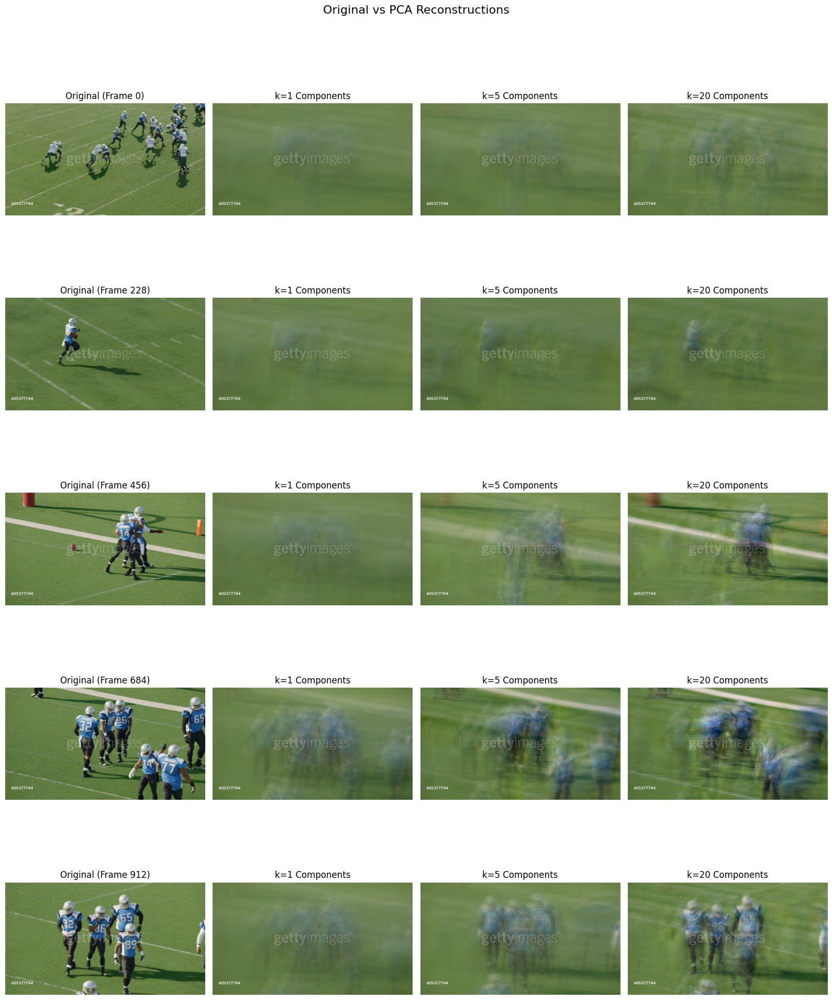

In [ ]:

# Pick sample frames spread across the video
sample_indices = [0, T // 4, T // 2, 3 * T // 4, T - 1]

fig, axes = plt.subplots(len(sample_indices), len(k_values) + 1, figsize=(16, 4 * len(sample_indices)))

for row, idx in enumerate(sample_indices):
    # Original
    axes[row, 0].imshow(frames[idx].astype(np.uint8))
    axes[row, 0].set_title(f'Original (Frame {idx})')
    axes[row, 0].axis('off')

    # Reconstructions
    for col, k in enumerate(k_values):
        recon_frame = reconstructions[k][idx].reshape(H, W, C).astype(np.uint8)
        axes[row, col + 1].imshow(recon_frame)
        axes[row, col + 1].set_title(f'k={k} Components')
        axes[row, col + 1].axis('off')

plt.suptitle('Original vs PCA Reconstructions', fontsize=16, y=1.01)
plt.tight_layout()
plt.savefig('task1_outputs/reconstruction_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

###Comments
QUESTIONS: Comment on what the first principal component appears
to represent, how motion and background information are encoded across different
components, and what types of visual information are progressively lost as fewer
components are retained.
1. The first PC appears to encode the more static features, relating to the background of the frame. In this case it is the Getty images watermark, and the stadium grass and some marking. In the frames wehre there are players they look like density clouds.
2. It seems the motion is captured better by the higher order components, although so far (between 5 and 20 components) it still looks like noise on top of the background.
3. As components are reduced, there is a lesser pixel intensity, and any motion is practically vanished.

#Task 2: keyframe extraction


In [ ]:
#make new folder for saving results.
os.makedirs('task2_outputs', exist_ok=True)

PCA with fixed components

In [ ]:
N_COMPONENTS = 10

pca = PCA(n_components=N_COMPONENTS)
X_scores = pca.fit_transform(X)              # project: (T, 10)
X_reconstructed = pca.inverse_transform(X_scores)  # reconstruct: (T, H*W*C)

print(f'Using {N_COMPONENTS} components')
print(f'Variance explained: {pca.explained_variance_ratio_.sum()*100:.2f}%')

Using 10 components
Variance explained: 31.46%


In [ ]:
# L2 norm between each original frame and its reconstruction
errors = np.linalg.norm(X - X_reconstructed, axis=1)

print(f'Error range: {errors.min():.2f} to {errors.max():.2f}')
print(f'Mean error: {errors.mean():.2f}')
print(f'Std error: {errors.std():.2f}')

Error range: 8919.74 to 29450.64
Mean error: 17890.92
Std error: 4826.12


####Plot Reconstruction Error Over Time

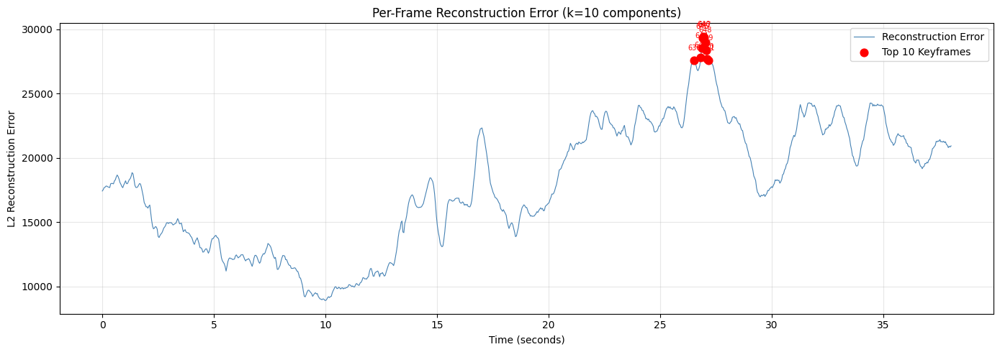

In [ ]:
time_axis = np.arange(T) / fps    # convert frame index to seconds

# Get top 10 keyframe indices
NUM_KEYFRAMES = 10
top_indices = np.argsort(errors)[::-1][:NUM_KEYFRAMES]
top_indices_sorted = np.sort(top_indices)   # sort by time for cleaner display

fig, ax = plt.subplots(figsize=(14, 5))
ax.plot(time_axis, errors, color='steelblue', linewidth=0.8, label='Reconstruction Error')
ax.scatter(time_axis[top_indices], errors[top_indices], color='red', s=60,
           zorder=5, label=f'Top {NUM_KEYFRAMES} Keyframes')

# Annotate each keyframe with its frame number
for idx in top_indices:
    ax.annotate(f'{idx}', (time_axis[idx], errors[idx]),
                textcoords='offset points', xytext=(0, 10),
                fontsize=7, ha='center', color='red')

ax.set_xlabel('Time (seconds)')
ax.set_ylabel('L2 Reconstruction Error')
ax.set_title(f'Per-Frame Reconstruction Error (k={N_COMPONENTS} components)')
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('task2_outputs/reconstruction_error_curve.png', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
# Print keyframe details
print(f'Top {NUM_KEYFRAMES} Keyframes (ranked by error):\n')
for rank, idx in enumerate(np.argsort(errors)[::-1][:NUM_KEYFRAMES], 1):
    print(f'  Rank {rank}: Frame {idx} | Time {time_axis[idx]:.2f}s | Error {errors[idx]:.2f}')

Top 10 Keyframes (ranked by error):

  Rank 1: Frame 646 | Time 26.94s | Error 29450.64
  Rank 2: Frame 647 | Time 26.99s | Error 29396.32
  Rank 3: Frame 645 | Time 26.90s | Error 29298.74
  Rank 4: Frame 648 | Time 27.03s | Error 28987.03
  Rank 5: Frame 644 | Time 26.86s | Error 28562.03
  Rank 6: Frame 649 | Time 27.07s | Error 28395.96
  Rank 7: Frame 643 | Time 26.82s | Error 27809.79
  Rank 8: Frame 650 | Time 27.11s | Error 27710.52
  Rank 9: Frame 651 | Time 27.15s | Error 27609.52
  Rank 10: Frame 636 | Time 26.53s | Error 27574.06


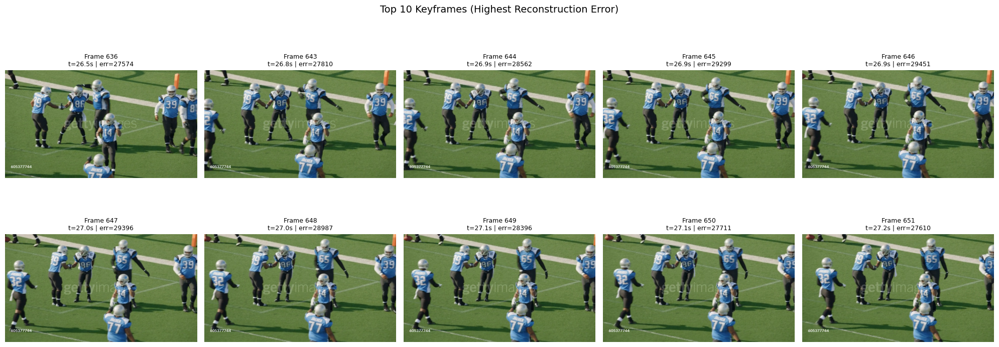

In [ ]:
fig, axes = plt.subplots(2, 5, figsize=(20, 8))

for i, idx in enumerate(top_indices_sorted):
    row, col = i // 5, i % 5
    axes[row, col].imshow(frames[idx].astype(np.uint8))
    axes[row, col].set_title(f'Frame {idx}\nt={time_axis[idx]:.1f}s | err={errors[idx]:.0f}',
                             fontsize=9)
    axes[row, col].axis('off')

plt.suptitle(f'Top {NUM_KEYFRAMES} Keyframes (Highest Reconstruction Error)', fontsize=14)
plt.tight_layout()
plt.savefig('task2_outputs/top_keyframes.png', dpi=150, bbox_inches='tight')
plt.show()

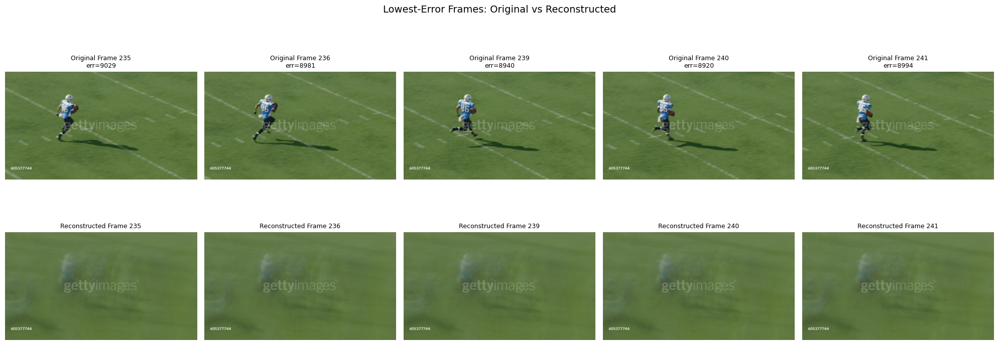

In [ ]:
# Show the 5 frames with the LOWEST error for contrast: Original vs Reconstructed
bottom_indices = np.argsort(errors)[:5]
sorted_bottom_indices = np.sort(bottom_indices)

fig, axes = plt.subplots(2, 5, figsize=(20, 8))

for i, idx in enumerate(sorted_bottom_indices):
    # Original Frame
    axes[0, i].imshow(frames[idx].astype(np.uint8))
    axes[0, i].set_title(f'Original Frame {idx}\nerr={errors[idx]:.0f}', fontsize=9)
    axes[0, i].axis('off')

    # Reconstructed Frame
    recon_frame = X_reconstructed[idx].reshape(H, W, C)
    axes[1, i].imshow(np.clip(recon_frame, 0, 255).astype(np.uint8))
    axes[1, i].set_title(f'Reconstructed Frame {idx}', fontsize=9)
    axes[1, i].axis('off')

plt.suptitle('Lowest-Error Frames: Original vs Reconstructed', fontsize=14)
plt.tight_layout()
plt.savefig('task2_outputs/lowest_error_comparison_v2.png', dpi=150, bbox_inches='tight')
plt.show()

###Compare the lowest error frames

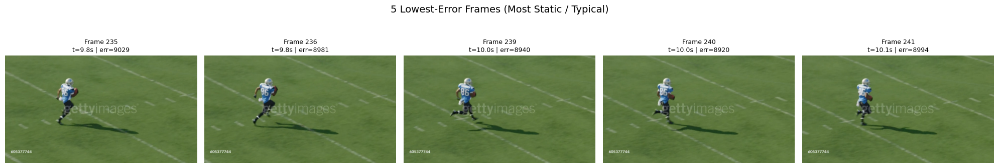

In [ ]:
# Show the 5 frames with the LOWEST error for contrast
bottom_indices = np.argsort(errors)[:5]

fig, axes = plt.subplots(1, 5, figsize=(20, 4))

for i, idx in enumerate(np.sort(bottom_indices)):
    axes[i].imshow(frames[idx].astype(np.uint8))
    axes[i].set_title(f'Frame {idx}\nt={time_axis[idx]:.1f}s | err={errors[idx]:.0f}', fontsize=9)
    axes[i].axis('off')

plt.suptitle('5 Lowest-Error Frames (Most Static / Typical)', fontsize=14)
plt.tight_layout()
plt.savefig('task2_outputs/lowest_error_frames.png', dpi=150, bbox_inches='tight')
plt.show()

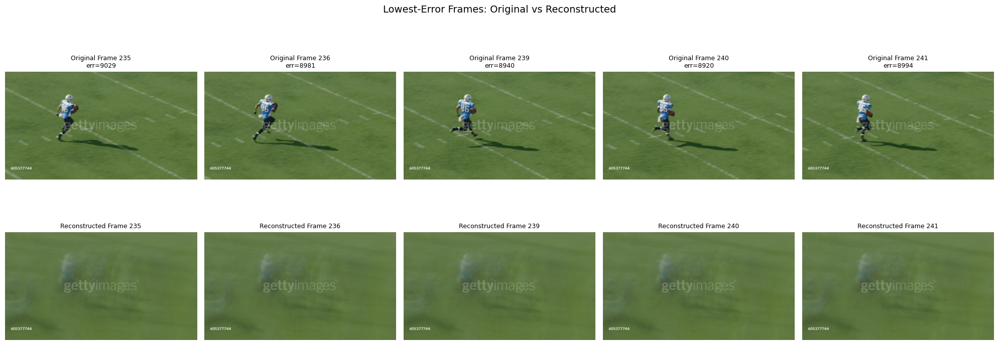

In [ ]:
# Show the 5 frames with the LOWEST error for contrast: Original vs Reconstructed
bottom_indices = np.argsort(errors)[:5]
sorted_bottom_indices = np.sort(bottom_indices)

fig, axes = plt.subplots(2, 5, figsize=(20, 8))

for i, idx in enumerate(sorted_bottom_indices):
    # Original Frame
    axes[0, i].imshow(frames[idx].astype(np.uint8))
    axes[0, i].set_title(f'Original Frame {idx}\nerr={errors[idx]:.0f}', fontsize=9)
    axes[0, i].axis('off')

    # Reconstructed Frame
    recon_frame = X_reconstructed[idx].reshape(H, W, C)
    axes[1, i].imshow(np.clip(recon_frame, 0, 255).astype(np.uint8))
    axes[1, i].set_title(f'Reconstructed Frame {idx}', fontsize=9)
    axes[1, i].axis('off')

plt.suptitle('Lowest-Error Frames: Original vs Reconstructed', fontsize=14)
plt.tight_layout()
plt.savefig('task2_outputs/lowest_error_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

###COMMENTS
#####Question: Comment on whether high error frames correspond to motion-heavy or event-rich moments, whether static frames yield lower errors, and whether peaks in the error curve align with meaningful play transitions.

High error frames do correspond to the high motion or high event/activity frames, however, this does not neccesarily correlate to meaningful play transitions. At least not at this level of sophistication and context. The higher motion between subsequnt frames seems to give the higher error, and correspond to high activity and vice-versa.

#TASK 3 : PCA Projection Magnitude

In [ ]:
os.makedirs('task3_outputs', exist_ok=True)

In [ ]:
N_COMPONENTS = 10

pca = PCA(n_components=N_COMPONENTS)
Z = pca.fit_transform(X)    # Z shape: (T, N_COMPONENTS) — PCA coordinates per frame

print(f'PCA subspace shape: {Z.shape}')
print(f'Variance explained: {pca.explained_variance_ratio_.sum()*100:.2f}%')

PCA subspace shape: (913, 10)
Variance explained: 31.46%


In [ ]:
# L2 norm of each frame's coordinate vector in PCA space
proj_magnitude = np.linalg.norm(Z, axis=1)

print(f'Projection magnitude range: {proj_magnitude.min():.2f} to {proj_magnitude.max():.2f}')
print(f'Mean: {proj_magnitude.mean():.2f}, Std: {proj_magnitude.std():.2f}')

Projection magnitude range: 3686.36 to 22489.42
Mean: 11653.93, Std: 4667.90


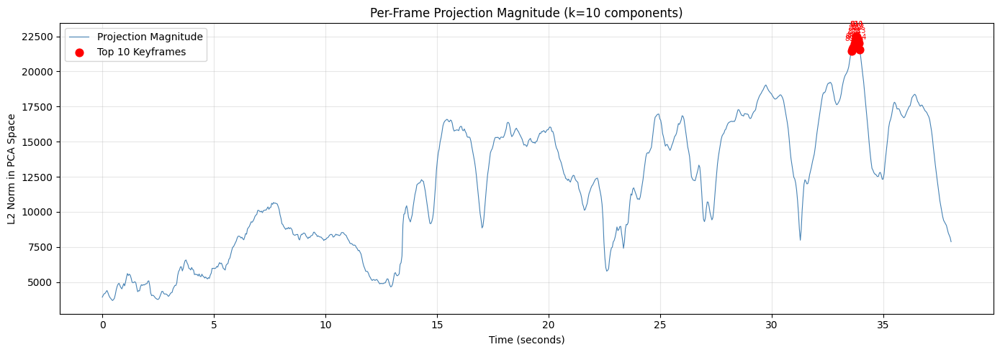

In [ ]:
time_axis = np.arange(T) / fps

NUM_KEYFRAMES = 10
top_indices = np.argsort(proj_magnitude)[::-1][:NUM_KEYFRAMES]
top_indices_sorted = np.sort(top_indices)

fig, ax = plt.subplots(figsize=(14, 5))
ax.plot(time_axis, proj_magnitude, color='steelblue', linewidth=0.8,
        label='Projection Magnitude')
ax.scatter(time_axis[top_indices], proj_magnitude[top_indices], color='red', s=60,
           zorder=5, label=f'Top {NUM_KEYFRAMES} Keyframes')

for idx in top_indices:
    ax.annotate(f'{idx}', (time_axis[idx], proj_magnitude[idx]),
                textcoords='offset points', xytext=(0, 10),
                fontsize=7, ha='center', color='red')

ax.set_xlabel('Time (seconds)')
ax.set_ylabel('L2 Norm in PCA Space')
ax.set_title(f'Per-Frame Projection Magnitude (k={N_COMPONENTS} components)')
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('task3_outputs/projection_magnitude_curve.png', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
print(f'Top {NUM_KEYFRAMES} Keyframes by Projection Magnitude:\n')
for rank, idx in enumerate(np.argsort(proj_magnitude)[::-1][:NUM_KEYFRAMES], 1):
    print(f'  Rank {rank}: Frame {idx} | Time {time_axis[idx]:.2f}s | Magnitude {proj_magnitude[idx]:.2f}')

Top 10 Keyframes by Projection Magnitude:

  Rank 1: Frame 811 | Time 33.83s | Magnitude 22489.42
  Rank 2: Frame 810 | Time 33.78s | Magnitude 22457.33
  Rank 3: Frame 812 | Time 33.87s | Magnitude 22284.94
  Rank 4: Frame 809 | Time 33.74s | Magnitude 22227.50
  Rank 5: Frame 813 | Time 33.91s | Magnitude 22026.16
  Rank 6: Frame 808 | Time 33.70s | Magnitude 21958.36
  Rank 7: Frame 807 | Time 33.66s | Magnitude 21730.88
  Rank 8: Frame 806 | Time 33.62s | Magnitude 21585.56
  Rank 9: Frame 814 | Time 33.95s | Magnitude 21534.68
  Rank 10: Frame 805 | Time 33.58s | Magnitude 21447.89


## Visualize the Top 10 Keyframes

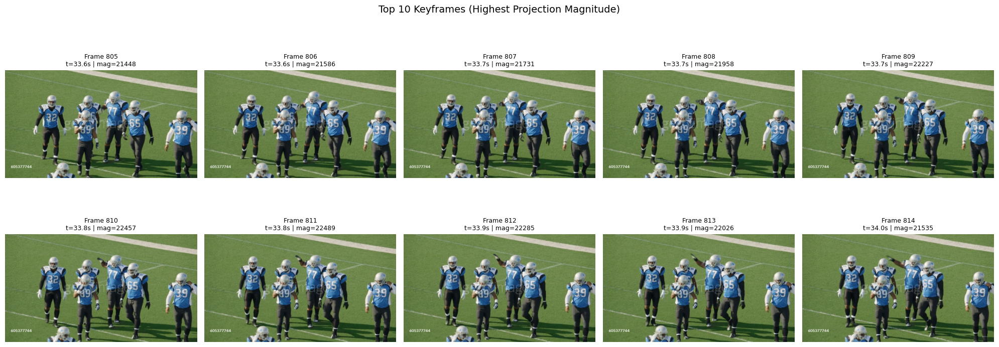

In [ ]:
fig, axes = plt.subplots(2, 5, figsize=(20, 8))

for i, idx in enumerate(top_indices_sorted):
    row, col = i // 5, i % 5
    axes[row, col].imshow(frames[idx].astype(np.uint8))
    axes[row, col].set_title(f'Frame {idx}\nt={time_axis[idx]:.1f}s | mag={proj_magnitude[idx]:.0f}',
                             fontsize=9)
    axes[row, col].axis('off')

plt.suptitle(f'Top {NUM_KEYFRAMES} Keyframes (Highest Projection Magnitude)', fontsize=14)
plt.tight_layout()
plt.savefig('task3_outputs/top_keyframes_projection.png', dpi=150, bbox_inches='tight')
plt.show()

#### Temporal Trajectory in PC1-PC2 Space

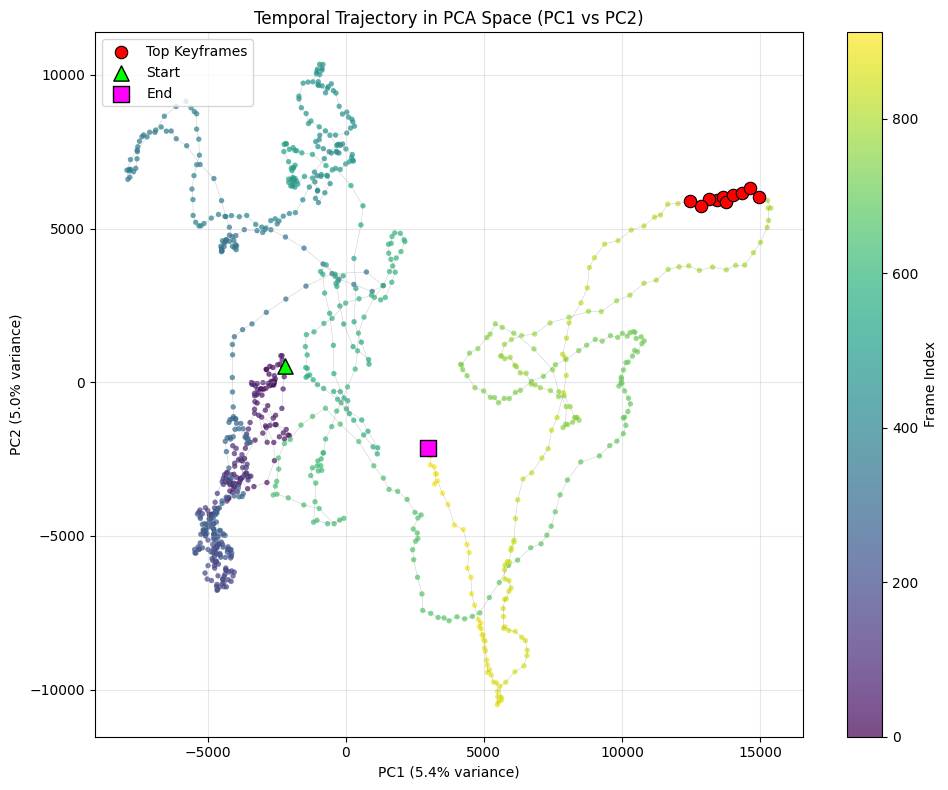

In [ ]:
fig, ax = plt.subplots(figsize=(10, 8))

# Color by time: early frames are dark, late frames are bright
scatter = ax.scatter(Z[:, 0], Z[:, 1], c=np.arange(T), cmap='viridis',
                     s=15, alpha=0.7, edgecolors='none')

# Draw trajectory line connecting consecutive frames
ax.plot(Z[:, 0], Z[:, 1], color='gray', linewidth=0.3, alpha=0.5)

# Mark top keyframes
ax.scatter(Z[top_indices, 0], Z[top_indices, 1], color='red', s=80,
           zorder=5, edgecolors='black', linewidths=0.8, label='Top Keyframes')

# Mark start and end
ax.scatter(Z[0, 0], Z[0, 1], color='lime', s=120, marker='^',
           zorder=6, edgecolors='black', label='Start')
ax.scatter(Z[-1, 0], Z[-1, 1], color='magenta', s=120, marker='s',
           zorder=6, edgecolors='black', label='End')

cbar = plt.colorbar(scatter, ax=ax, label='Frame Index')
ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% variance)')
ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% variance)')
ax.set_title('Temporal Trajectory in PCA Space (PC1 vs PC2)')
ax.legend(loc='upper left')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('task3_outputs/pca_trajectory_pc1_pc2.png', dpi=150, bbox_inches='tight')
plt.show()

#### Individual PC Coordinate Trajectories Over Time

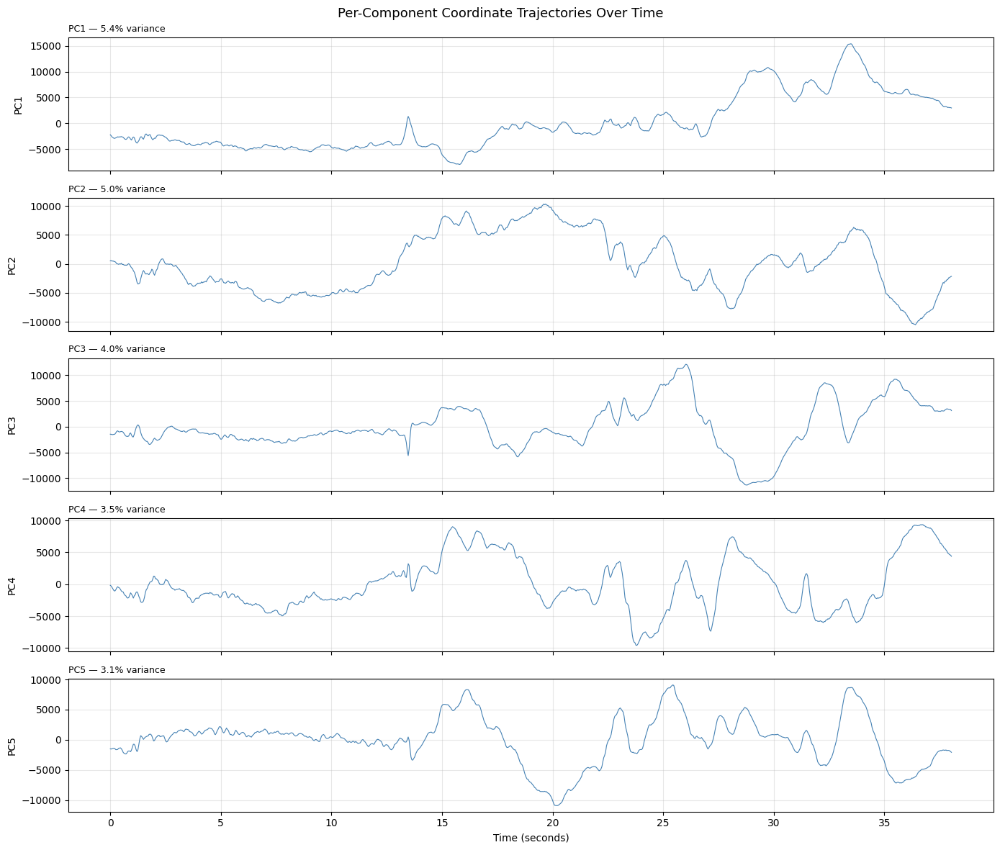

In [ ]:
fig, axes = plt.subplots(5, 1, figsize=(14, 12), sharex=True)

for i in range(5):
    axes[i].plot(time_axis, Z[:, i], linewidth=0.8, color='steelblue')
    axes[i].set_ylabel(f'PC{i+1}', fontsize=10)
    axes[i].set_title(f'PC{i+1} — {pca.explained_variance_ratio_[i]*100:.1f}% variance',
                      fontsize=9, loc='left')
    axes[i].grid(True, alpha=0.3)

axes[-1].set_xlabel('Time (seconds)')
plt.suptitle('Per-Component Coordinate Trajectories Over Time', fontsize=13)
plt.tight_layout()
plt.savefig('task3_outputs/pc_trajectories.png', dpi=150, bbox_inches='tight')
plt.show()

####Comment on whether frames with large projection magnitude correspond to scene shifts or distinctive formations, how this method differs from reconstruction-error-based selection, and whether certain components appear to capture structured motion patterns.

Large projection indicates that the frames are resembling something close to the average pCA reconstruciton (in the PCA embedding space) of the video content. therefore it is more likely ro represent a distinctive formation occuring that is characteristic of the video- in this case the game formation being emulated by the nu,mber of players gahering. ON the other hand theoretically reconstrcuoion error tells us about the difference or deviation from the norm of the video content and therefroe it would mark the scene change occurring in the video. This is also denoted by the different frame number from each of the method respectively. Projection magnitude focuses on frames that are most characteristic of the dominant patterns.


#TASK 4

In [ ]:
os.makedirs('task4_outputs', exist_ok=True)

In [ ]:
# Compute temporal frame differences: D[t] = Frame[t] - Frame[t-1]
# We'll use the original 'frames' array (T, H, W, C)
# The first frame has no predecessor, so we'll start from index 1

frame_diffs = []
for i in range(1, T):
    # Calculate difference
    diff = frames[i] - frames[i-1]
    frame_diffs.append(diff)

frame_diffs = np.array(frame_diffs)
print(f'Frame differences shape: {frame_diffs.shape}')



Frame differences shape: (912, 324, 576, 3)


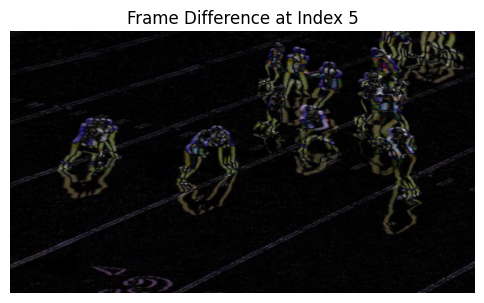

In [ ]:
# Visualize a sample difference frame
sample_idx = 5
if sample_idx < len(frame_diffs):
    plt.figure(figsize=(6, 4))
    # Take absolute value to show magnitude of change, clip to range
    diff_img = np.clip(np.abs(frame_diffs[sample_idx]), 0, 255).astype(np.uint8)
    plt.imshow(diff_img)
    plt.title(f'Frame Difference at Index {sample_idx}')
    plt.axis('off')
    plt.show()

In [ ]:
# Flatten the difference frames and apply PCA to this motion-focused
# representation.
#(n_samples, n_features)
X_diff = frame_diffs.reshape(frame_diffs.shape[0], -1)

motion_pca = PCA(n_components= 150) #limited to 80% from original frame
motion_pca.fit(X_diff)

print(f'Motion PCA fitted on shape: {X_diff.shape}')

Motion PCA fitted on shape: (912, 559872)


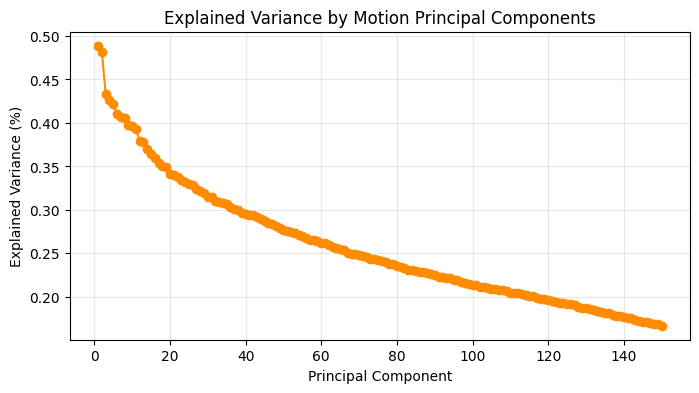

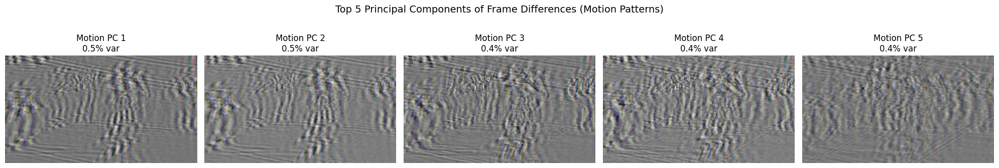

In [ ]:
# Plot Explained Variance Ratio for Motion PCA
plt.figure(figsize=(8, 4))
plt.plot(range(1, len(motion_pca.explained_variance_ratio_) + 1),
         motion_pca.explained_variance_ratio_ * 100, 'o-', color='darkorange')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance (%)')
plt.title('Explained Variance by Motion Principal Components')
plt.grid(True, alpha=0.3)
plt.savefig('task4_outputs/motion_pca_variance.png', dpi=150, bbox_inches='tight')
plt.show()

# Visualize the Top 5 Motion Patterns (Eigen-motions)
fig, axes = plt.subplots(1, 5, figsize=(20, 4))

for i, ax in enumerate(axes):
    # Reshape component to (H, W, C)
    eigen_motion = motion_pca.components_[i].reshape(H, W, C)

    # Normalize for visualization: Scale to 0-255 range
    # We use min-max scaling because components have negative values
    e_min, e_max = eigen_motion.min(), eigen_motion.max()
    eigen_motion_norm = (eigen_motion - e_min) / (e_max - e_min) * 255

    ax.imshow(eigen_motion_norm.astype(np.uint8))
    ax.set_title(f'Motion PC {i+1}\n{motion_pca.explained_variance_ratio_[i]*100:.1f}% var')
    ax.axis('off')

plt.suptitle('Top 5 Principal Components of Frame Differences (Motion Patterns)', fontsize=14)
plt.tight_layout()
plt.savefig('task4_outputs/motion_patterns.png', dpi=150, bbox_inches='tight')
plt.show()

####Identify frames associated with large pro-
jections in this difference-based PCA space and extract frames corresponding to
2high motion energy.

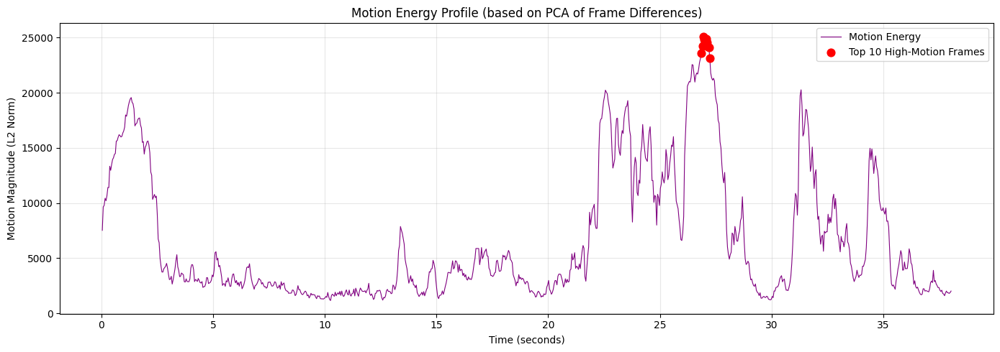

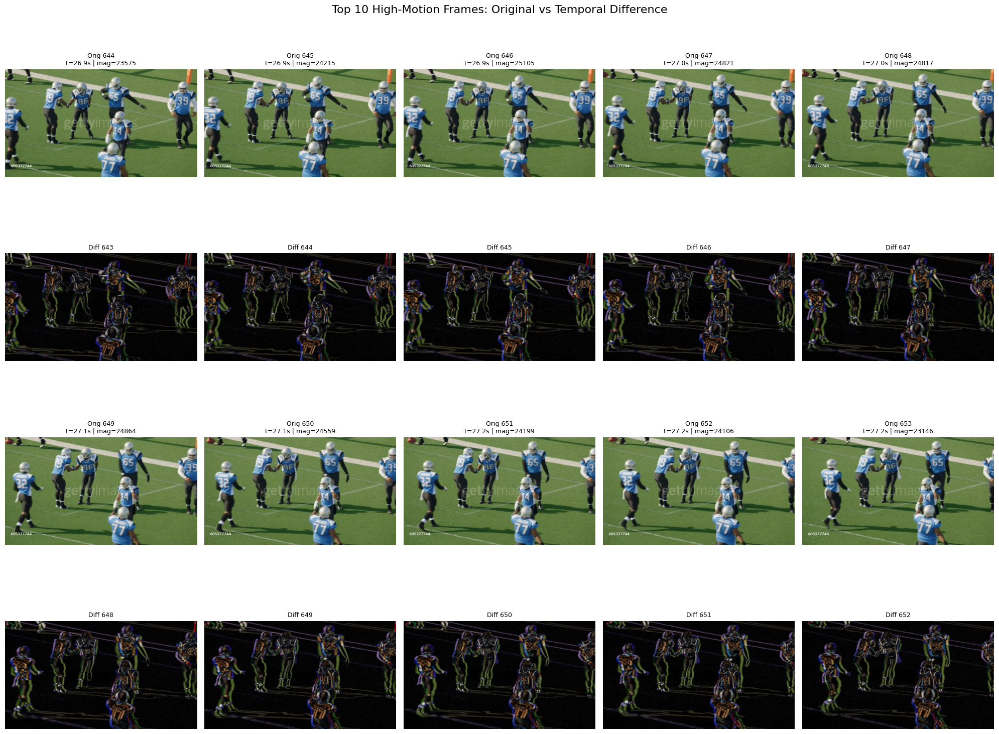

In [ ]:
# 1. Project difference frames onto the motion PCA space
Z_motion = motion_pca.transform(X_diff)

# 2. Compute the L2 norm (magnitude) of the projection vector for each frame
# High magnitude = High motion energy (large deviation from mean difference)
motion_magnitude = np.linalg.norm(Z_motion, axis=1)

# Adjust time axis for differences (we lost the first frame)
time_axis_diff = time_axis[1:]

# 3. Find top 10 frames with highest motion energy
NUM_MOTION_KEYFRAMES = 10
top_motion_indices = np.argsort(motion_magnitude)[::-1][:NUM_MOTION_KEYFRAMES]
top_motion_indices_sorted = np.sort(top_motion_indices)

# Plot Motion Energy over Time
fig, ax = plt.subplots(figsize=(14, 5))
ax.plot(time_axis_diff, motion_magnitude, color='purple', linewidth=0.8, label='Motion Energy')
ax.scatter(time_axis_diff[top_motion_indices], motion_magnitude[top_motion_indices],
           color='red', s=60, zorder=5, label=f'Top {NUM_MOTION_KEYFRAMES} High-Motion Frames')

ax.set_xlabel('Time (seconds)')
ax.set_ylabel('Motion Magnitude (L2 Norm)')
ax.set_title('Motion Energy Profile (based on PCA of Frame Differences)')
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('task4_outputs/motion_energy_profile.png', dpi=150, bbox_inches='tight')
plt.show()

# Visualize the Top High-Motion Frames: Original vs Difference
# We will use 4 rows and 5 columns. Rows 0 & 2 for original, Rows 1 & 3 for differences.
fig, axes = plt.subplots(4, 5, figsize=(20, 16))

for i, idx in enumerate(top_motion_indices_sorted):
    original_frame_idx = idx + 1

    # Calculate grid position
    row_orig = (i // 5) * 2
    row_diff = row_orig + 1
    col = i % 5

    # Plot Original Frame
    axes[row_orig, col].imshow(frames[original_frame_idx].astype(np.uint8))
    axes[row_orig, col].set_title(f'Orig {original_frame_idx}\nt={time_axis[original_frame_idx]:.1f}s | mag={motion_magnitude[idx]:.0f}',
                                 fontsize=9)
    axes[row_orig, col].axis('off')

    # Plot Difference Frame (Absolute value scaled for visibility)
    diff_img = np.clip(np.abs(frame_diffs[idx]), 0, 255).astype(np.uint8)
    axes[row_diff, col].imshow(diff_img)
    axes[row_diff, col].set_title(f'Diff {idx}', fontsize=9)
    axes[row_diff, col].axis('off')

plt.suptitle(f'Top {NUM_MOTION_KEYFRAMES} High-Motion Frames: Original vs Temporal Difference', fontsize=16)
plt.tight_layout()
plt.savefig('task4_outputs/high_motion_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

COMMENT: On whether background content is suppressed in this
formulation, whether moving players become more distinguishable, and how this motion-based PCA compares to applying PCA directly on raw frames.
 yES in this case background motion is suppressed and the motion in the foreground (notably the  players nad their shadows that are moving are much easier to distinguish. Because in this case only the difference is being use to run PCA it is computationally more efficient and relevant to the insight that we need from the analysis of the video.

# **Task 5:** Low-Rank and Sparse Decomposition (Robust PCA Perspective)

In [4]:
import os
os.makedirs('task5_outputs', exist_ok=True)

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Load video
cap = cv2.VideoCapture("football_video.mp4")
frames = []
while True:
    ret, frame = cap.read()
    if not ret:
        break
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    frame = cv2.resize(frame,(160,90))
    frames.append(frame)

cap.release()
frames = np.array(frames)
T,H,W,C = frames.shape

print(f'Number of frames (T): {T}')
print(f'Frame dimensions: {H} x {W} x {C}')
print(f'Flattened vector length (H*W*C): {H * W * C}')

# Flatten each frame into a row vector and stack into matrix X
X = frames.reshape(T, -1)
print(f'Data matrix X shape: {X.shape}')      # (T, H*W*C)
print(f'Memory usage: {X.nbytes / 1e9:.2f} GB')

# Low-rank PCA reconstruction
k = 5   # number of PCA components
pca = PCA(n_components=k)
Z = pca.fit_transform(X)
X_lowrank = pca.inverse_transform(Z)

# Sparse component
X_sparse = X - X_lowrank

# reshape back to frames
lowrank_frames = X_lowrank.reshape(T, H, W, C)
sparse_frames = X_sparse.reshape(T, H, W, C)

# Normalize function
def normalize(img):
    img = img - img.min()
    img = img / (img.max() + 1e-8)
    return img

# Sparse magnitude
motion_energy = np.linalg.norm(X_sparse, axis=1)
top_k = 10
top_frames = np.argsort(motion_energy)[-top_k:][::-1]

Number of frames (T): 913
Frame dimensions: 90 x 160 x 3
Flattened vector length (H*W*C): 43200
Data matrix X shape: (913, 43200)
Memory usage: 0.04 GB


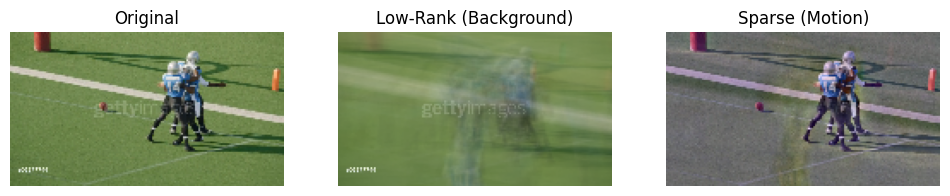

In [7]:
# show example frame: original / background / motion
frame_id = T//2
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)

plt.imshow(frames[frame_id].astype(np.uint8))
plt.title("Original")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(lowrank_frames[frame_id].clip(0,255).astype(np.uint8))
plt.title("Low-Rank (Background)")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(normalize(sparse_frames[frame_id]))
plt.title("Sparse (Motion)")
plt.axis("off")
plt.show()

Frames with highest motion: [645 646 644 647 643 648 642 641 636 638]


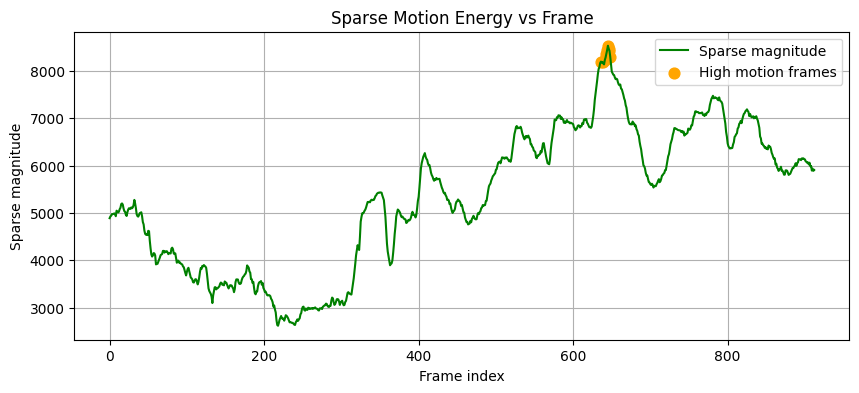

In [8]:
# Sparse magnitude vs frame number for largest sparse magnitude detection
print("Frames with highest motion:", top_frames)
plt.figure(figsize=(10,4))
plt.plot(motion_energy,'g',linewidth=1.5,label='Sparse magnitude')
plt.scatter(top_frames,motion_energy[top_frames],color='orange',s=60,label='High motion frames')
plt.xlabel("Frame index")
plt.ylabel("Sparse magnitude")
plt.title("Sparse Motion Energy vs Frame")
plt.legend()
plt.grid(True)
plt.show()

Frames with highest motion: [645 646 644 647 643 648 642 641 636 638]


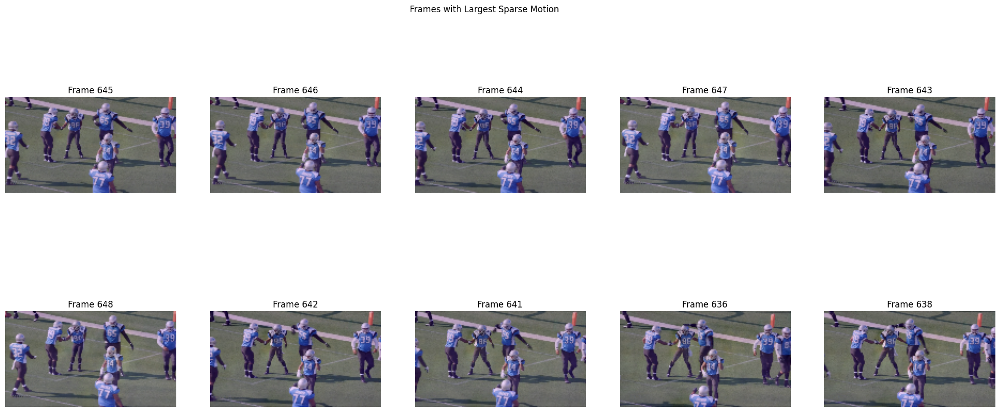

In [9]:
# Plot high motion frames
print("Frames with highest motion:", top_frames)
plt.figure(figsize=(25,10))
for i, idx in enumerate(top_frames):
    plt.subplot(2,5,i+1)
    plt.imshow(normalize(sparse_frames[idx]))
    plt.title(f"Frame {idx}")
    plt.axis("off")
plt.suptitle("Frames with Largest Sparse Motion")
plt.show()


**Whether dynamic objects are effectively isolated in the sparse component, whether subtle motion is captured, and how this decomposi- tion compares with classical PCA-based reconstruction error in isolating meaningful events.**

### The low-rank component captures the static background of the scene, such as the football field and yard lines, while the sparse component highlights dynamic objects like moving players and the ball. As a result, the sparse frames effectively isolate motion by suppressing most of the background. Larger player movements are clearly visible, although very subtle motion may not always be captured strongly because the low-rank model can absorb gradual changes. Compared with classical PCA reconstruction error, the sparse decomposition more directly separates foreground motion from background structure, making meaningful motion events easier to identify.

Gen AI statement: Gemini was used for plotting and for some of the cleaning up of the code such that it would look better.